In [1]:
# Load the necessary libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import cv2
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import tensorflow as tf
import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import save_model, load_model
from tensorflow.keras.preprocessing import image as keras_image
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.preprocessing import label_binarize

In [2]:
# Define the root directory containing the image dataset organized by class folders.
data_dir = "G:/ksiu/Level 4/Graduation Project (AIE493) Dr. Saeed/graduation project/code ai & Data/plantvillage dataset/color"

In [3]:
# List the class folders (representing different plant diseases/conditions).
class_folders = os.listdir(data_dir)
print("Dataset Classes:")
for cls in class_folders:
    print(cls)

Dataset Classes:
Aphids_cotton
Army worm_cotton
Bacterial blight_cotton
cotton_curl_virus
cotton_fussarium_wilt
Healthy_cotton
Pepper_bell__bacterial_spot
Pepper_bell__healthy
Potato___Early_blight
Potato___healthy
Potato___Late_blight
Powdery mildew_cotton
Strawberry___healthy
Strawberry___Leaf_scorch
Target spot_cotton
Tomato___Bacterial_spot
Tomato___Early_blight
Tomato___healthy
Tomato___Late_blight
Tomato___Leaf_Mold
Tomato___Septoria_leaf_spot
Tomato___Spider_mites Two-spotted_spider_mite
Tomato___Target_Spot
Tomato___Tomato_mosaic_virus
Tomato___Tomato_Yellow_Leaf_Curl_Virus


In [4]:
# Collect all image file paths and their corresponding labels (class folder names).
image_paths = []
labels = []
for class_folder in class_folders:
    class_path = os.path.join(data_dir, class_folder)
    image_files = os.listdir(class_path)
    for image_file in image_files:
        image_path = os.path.join(class_path, image_file)
        image_paths.append(image_path)
        labels.append(class_folder)

In [5]:
# Function to validate image files, ensuring they can be opened and are not corrupted.
def validate_images(image_paths):
    """
    Validate images and return a list of valid image paths.
    """
    valid_paths = []
    corrupted_paths = []

    for img_path in image_paths:
        try:
            # Try to open the image with PIL
            with Image.open(img_path) as img:
                img.verify()  # Verify it's actually an image
                # Try to load it with cv2 as well
                cv_img = cv2.imread(img_path)
                if cv_img is not None:
                    valid_paths.append(img_path)
                else:
                    corrupted_paths.append(img_path)
        except Exception as e:
            print(f"Corrupted or invalid image found: {img_path}")
            print(f"Error: {str(e)}")
            corrupted_paths.append(img_path)

    print(f"Total images checked: {len(image_paths)}")
    print(f"Valid images: {len(valid_paths)}")
    print(f"Corrupted images: {len(corrupted_paths)}")

    if corrupted_paths:
        print("\nCorrupted image paths:")
        for path in corrupted_paths:
            print(path)

    return valid_paths

In [6]:
# Validate images before creating the DataFrame
print("Validating images...")
image_paths = validate_images(image_paths)

Validating images...
Corrupted or invalid image found: G:/ksiu/Level 4/Graduation Project (AIE493) Dr. Saeed/graduation project/code ai & Data/plantvillage dataset/color\Strawberry___Leaf_scorch\Eggplant Healthy Leaf
Error: [Errno 13] Permission denied: 'G:/ksiu/Level 4/Graduation Project (AIE493) Dr. Saeed/graduation project/code ai & Data/plantvillage dataset/color\\Strawberry___Leaf_scorch\\Eggplant Healthy Leaf'
Total images checked: 39779
Valid images: 39777
Corrupted images: 2

Corrupted image paths:
G:/ksiu/Level 4/Graduation Project (AIE493) Dr. Saeed/graduation project/code ai & Data/plantvillage dataset/color\cotton_curl_virus\curl314.gif
G:/ksiu/Level 4/Graduation Project (AIE493) Dr. Saeed/graduation project/code ai & Data/plantvillage dataset/color\Strawberry___Leaf_scorch\Eggplant Healthy Leaf


In [7]:
# Create DataFrame with only valid images
df = pd.DataFrame({'image_path': image_paths, 'label': [os.path.basename(os.path.dirname(path)) for path in image_paths]})
df.head()
df.shape
print("The classes:\n", np.unique(df['label']))

The classes:
 ['Aphids_cotton' 'Army worm_cotton' 'Bacterial blight_cotton'
 'Healthy_cotton' 'Pepper_bell__bacterial_spot' 'Pepper_bell__healthy'
 'Potato___Early_blight' 'Potato___Late_blight' 'Potato___healthy'
 'Powdery mildew_cotton' 'Strawberry___Leaf_scorch' 'Strawberry___healthy'
 'Target spot_cotton' 'Tomato___Bacterial_spot' 'Tomato___Early_blight'
 'Tomato___Late_blight' 'Tomato___Leaf_Mold' 'Tomato___Septoria_leaf_spot'
 'Tomato___Spider_mites Two-spotted_spider_mite' 'Tomato___Target_Spot'
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus' 'Tomato___Tomato_mosaic_virus'
 'Tomato___healthy' 'cotton_curl_virus' 'cotton_fussarium_wilt']


In [8]:
# Define the class_labels with class labels and corresponding indices
class_labels = {
    0: "Aphids_cotton", 1: "Army worm_cotton", 2: "Bacterial blight_cotton", 3: "Healthy_cotton",
    4: "Pepper_bell__bacterial_spot", 5: "Pepper_bell__healthy", 6: "Potato___Early_blight",
    7: "Potato___Late_blight", 8: "Potato___healthy", 9: "Powdery mildew_cotton",
    10: "Strawberry___Leaf_scorch", 11: "Strawberry___healthy",
    12: "Target spot_cotton", 13: "Tomato___Bacterial_spot",
    14: "Tomato___Early_blight", 15: "Tomato___Late_blight", 16: "Tomato___Leaf_Mold",
    17: "Tomato___Septoria_leaf_spot", 18: "Tomato___Spider_mites Two-spotted_spider_mite", 19: "Tomato___Target_Spot",
    20: "Tomato___Tomato_Yellow_Leaf_Curl_Virus", 21: "Tomato___Tomato_mosaic_virus",
    22: "Tomato___healthy", 23: "cotton_curl_virus", 24: "cotton_fussarium_wilt"
}

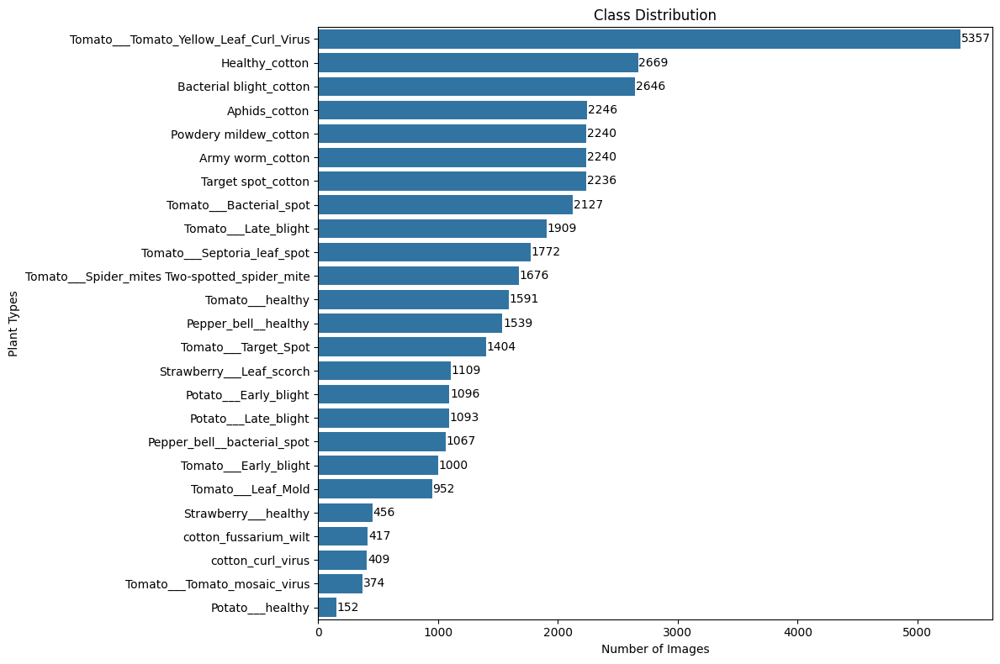

In [9]:
# Analyze and visualize the distribution of images per class.
class_counts = df['label'].value_counts()
plt.figure(figsize=(12, 8))
ax = sns.barplot(x=class_counts.values, y=class_counts.index, orient='h')
plt.title('Class Distribution')
plt.xlabel('Number of Images')
plt.ylabel('Plant Types')
plt.tight_layout()
for i, v in enumerate(class_counts.values):
    ax.text(v + 5, i, str(v), color='black', va='center')
plt.show()

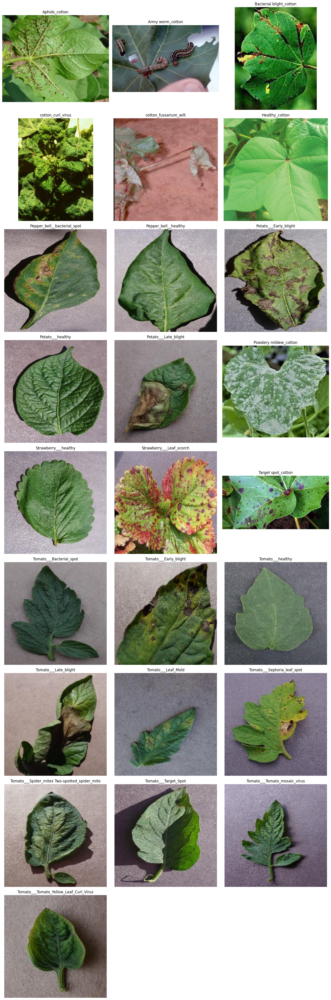

In [10]:
# Display sample images from each class
num_classes = len(df['label'].unique())
num_images_per_row = 3
num_rows = (num_classes + num_images_per_row - 1) // num_images_per_row
plt.figure(figsize=(15, 5 * num_rows))
for i, plant_class in enumerate(df['label'].unique()):
    plt.subplot(num_rows, num_images_per_row, i + 1)
    image_path = os.path.join(data_dir, df[df['label'] == plant_class]['image_path'].iloc[0])
    if os.path.exists(image_path):
        sample_image = cv2.imread(image_path)
        if sample_image is not None:
            plt.imshow(cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB))
            plt.title(plant_class)
            plt.axis('off')
        else:
            print(f"Error: Unable to load image from path: {image_path}")
    else:
        print(f"Error: Image path does not exist: {image_path}")
plt.tight_layout()
plt.show()

In [11]:
# Convert string labels to numerical indices for model training.
class_labels_dict = {class_label: idx for idx, class_label in enumerate(np.unique(df['label']))}
df['label'] = df['label'].map(class_labels_dict)

In [12]:
# Split the data into training, validation, and test sets. Stratify to maintain class proportions.
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42, stratify=df['label'])
train_df, val_df = train_test_split(train_df, test_size=0.2, random_state=42, stratify=train_df['label'])
train_df.shape, val_df.shape, test_df.shape

((25456, 2), (6365, 2), (7956, 2))

In [13]:
class_names_list = [class_labels_dict[key] for key in sorted(class_labels_dict.keys())]

In [14]:
# Convert numerical labels back to strings for ImageDataGenerator compatibility.
train_df['label'] = train_df['label'].astype(str)
val_df['label'] = val_df['label'].astype(str)
test_df['label'] = test_df['label'].astype(str)
print(train_df['label'].unique())

['14' '17' '12' '16' '20' '10' '3' '15' '22' '9' '1' '0' '23' '7' '18' '4'
 '19' '13' '21' '2' '5' '6' '11' '24' '8']


In [15]:
# Define ImageDataGenerators for training (with augmentation), validation, and testing (only rescaling).
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

In [16]:
# Create data generators that flow data from the DataFrames.
train_generator = train_datagen.flow_from_dataframe(
    train_df, x_col='image_path', y_col='label', target_size=(224, 224),
    batch_size=32, class_mode='categorical', shuffle=True, seed=42
)
val_generator = val_datagen.flow_from_dataframe(
    val_df, x_col='image_path', y_col='label', target_size=(224, 224),
    batch_size=32, class_mode='categorical', shuffle=False
)
test_generator = test_datagen.flow_from_dataframe(
    test_df, x_col='image_path', y_col='label', target_size=(224, 224),
    batch_size=32, class_mode='categorical', shuffle=False
)
print(f'Training samples: {train_generator.samples}, Validation samples: {val_generator.samples}, Test samples: {test_generator.samples}')

Found 25456 validated image filenames belonging to 25 classes.
Found 6365 validated image filenames belonging to 25 classes.
Found 7955 validated image filenames belonging to 25 classes.
Training samples: 25456, Validation samples: 6365, Test samples: 7955


C:\Users\m2921\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\keras\src\legacy\preprocessing\image.py:920: UserWarning: Found 1 invalid image filename(s) in x_col="image_path". These filename(s) will be ignored.
  warnings.warn(


In [17]:
# Define model parameters.
input_shape = (224, 224, 3)
n_classes = len(train_generator.class_indices)

In [18]:
# Build the Convolutional Neural Network (CNN) model architecture.
model = keras.Sequential([
    # Block 1
    keras.layers.Conv2D(filters=64, kernel_size=(7, 7), strides=(3, 3), padding='valid', use_bias=False, input_shape=input_shape),
    keras.layers.BatchNormalization(),
    keras.layers.Activation('relu'),
    keras.layers.MaxPool2D(pool_size=(3, 3)),

    # Block 2
    keras.layers.Conv2D(filters=128, kernel_size=(3, 3), padding='same', use_bias=False),
    keras.layers.BatchNormalization(),
    keras.layers.Activation('relu'),
    keras.layers.MaxPool2D(pool_size=(2, 2)),

    # Block 3
    keras.layers.Conv2D(filters=128, kernel_size=(3, 3), padding='same', use_bias=False),
    keras.layers.BatchNormalization(),
    keras.layers.Activation('relu'),
    keras.layers.MaxPool2D(pool_size=(2, 2)),

    # Block 4
    keras.layers.Conv2D(filters=256, kernel_size=(3, 3), padding='same', use_bias=False),
    keras.layers.BatchNormalization(),
    keras.layers.Activation('relu'),
    keras.layers.MaxPool2D(pool_size=(2, 2)),

    # Block 5
    keras.layers.Conv2D(filters=256, kernel_size=(3, 3), padding='same', use_bias=False),
    keras.layers.BatchNormalization(),
    keras.layers.Activation('relu'),
    keras.layers.MaxPool2D(pool_size=(2, 2)),

    # Classifier Head
    keras.layers.Flatten(),
    keras.layers.Dense(256, use_bias=False),
    keras.layers.BatchNormalization(),
    keras.layers.Activation('relu'),
    keras.layers.Dense(256, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(n_classes, activation='softmax')
])

C:\Users\m2921\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


In [19]:
# Compile the model with loss function, optimizer, and metrics.
model.compile(
    loss='categorical_crossentropy',
    optimizer=tf.optimizers.Adam(),
    metrics=['accuracy']
)

In [20]:
# model summary.
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 73, 73, 64)     │         9,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 73, 73, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 73, 73, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 24, 24, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 24, 24, 128)    │        73,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 24, 24, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 24, 24, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 12, 12, 128)    │       147,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 12, 12, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 6, 6, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 6, 6, 256)      │       294,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 6, 6, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 6, 6, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 3, 3, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 3, 3, 256)      │       589,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 3, 3, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 3, 3, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 1, 1, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │        65,536 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 1,257,433 (4.80 MB)

 Trainable params: 1,255,257 (4.79 MB)

 Non-trainable params: 2,176 (8.50 KB)

In [21]:
# Define callbacks for early stopping and learning rate reduction during training.
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

In [22]:
# Train the model using the prepared data generators and callbacks.
history = model.fit(
    train_generator,
    batch_size=32,
    validation_data=val_generator,
    epochs=50,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/50


C:\Users\m2921\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


796/796 ━━━━━━━━━━━━━━━━━━━━ 407s 504ms/step - accuracy: 0.4450 - loss: 1.7982 - val_accuracy: 0.5676 - val_loss: 1.4796 - learning_rate: 0.0010
Epoch 2/50
796/796 ━━━━━━━━━━━━━━━━━━━━ 406s 507ms/step - accuracy: 0.6874 - loss: 0.9607 - val_accuracy: 0.4655 - val_loss: 2.0596 - learning_rate: 0.0010
Epoch 3/50
796/796 ━━━━━━━━━━━━━━━━━━━━ 406s 506ms/step - accuracy: 0.7622 - loss: 0.7331 - val_accuracy: 0.7821 - val_loss: 0.6483 - learning_rate: 0.0010
Epoch 4/50
796/796 ━━━━━━━━━━━━━━━━━━━━ 401s 501ms/step - accuracy: 0.8008 - loss: 0.6106 - val_accuracy: 0.7972 - val_loss: 0.6476 - learning_rate: 0.0010
Epoch 5/50
796/796 ━━━━━━━━━━━━━━━━━━━━ 397s 495ms/step - accuracy: 0.8192 - loss: 0.5449 - val_accuracy: 0.6006 - val_loss: 1.5847 - learning_rate: 0.0010
Epoch 6/50
796/796 ━━━━━━━━━━━━━━━━━━━━ 1131s 1s/step - accuracy: 0.8402 - loss: 0.4966 - val_accuracy: 0.7822 - val_loss: 0.6765 - learning_rate: 0.0010
Epoch 7/50
796/796 ━━━━━━━━━━━━━━━━━━━━ 516s 644ms/step - accuracy: 0.8626 - 

In [23]:
# Evaluate the trained model on the unseen test dataset.
scores = model.evaluate(test_generator)
print(f"Initial Test Loss: {scores[0]}, Initial Test Accuracy: {scores[1]}")

249/249 ━━━━━━━━━━━━━━━━━━━━ 214s 863ms/step - accuracy: 0.9789 - loss: 0.0767
Initial Test Loss: 0.07873231917619705, Initial Test Accuracy: 0.9795097708702087


In [24]:
# Make predictions on the test set to analyze performance.
test_predictions = model.predict(test_generator)
test_predicted_labels = np.argmax(test_predictions, axis=1)
test_true_labels = test_generator.classes

249/249 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step


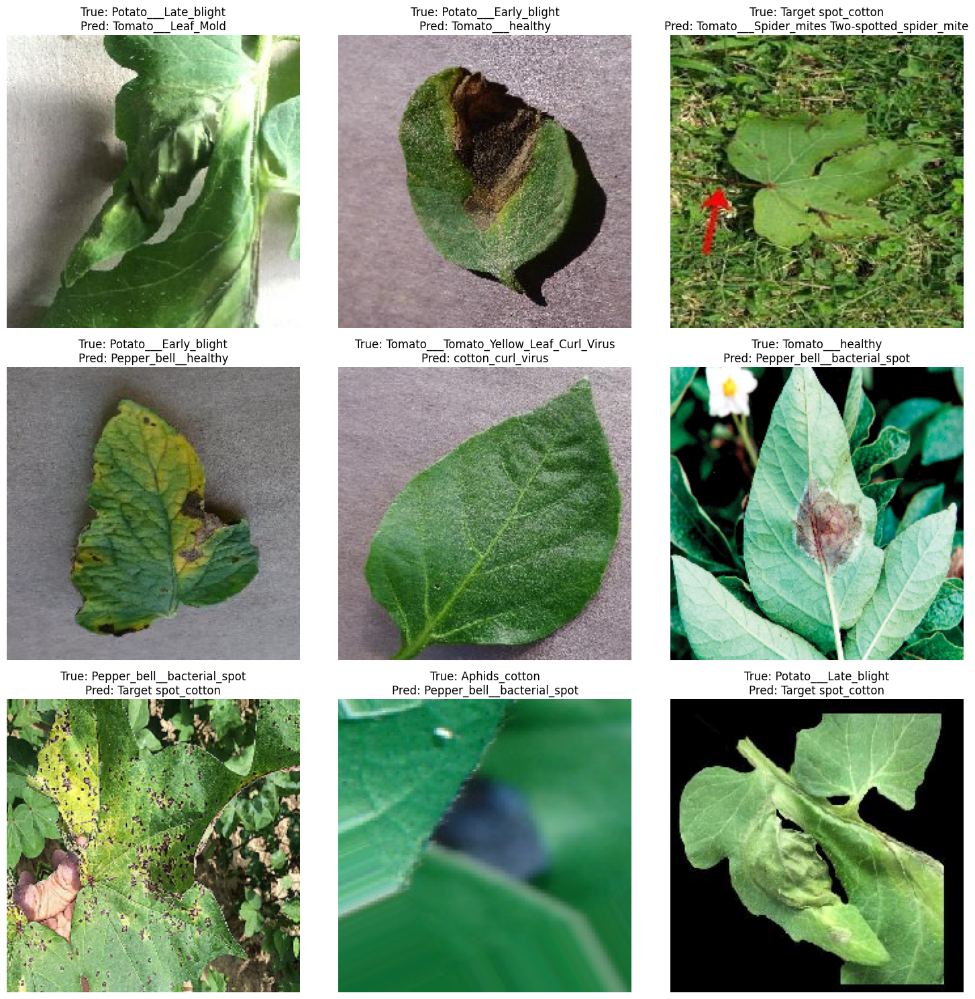

In [25]:
# Identify and visualize some misclassified images.
error_df = pd.DataFrame({'True Label': test_true_labels, 'Predicted Label': test_predicted_labels})
misclassified_indices = error_df[error_df['True Label'] != error_df['Predicted Label']].index
class_names_list = list(test_generator.class_indices.keys())
plt.figure(figsize=(15, 15))
for i, idx in enumerate(misclassified_indices[:9]): # Show first 9 errors
    img_path = test_df.iloc[idx]['image_path']
    img = keras_image.load_img(img_path, target_size=(224, 224))
    plt.subplot(3, 3, i+1)
    plt.imshow(img)
    true_label_name = class_labels[test_true_labels[idx]]
    pred_label_name = class_labels[test_predicted_labels[idx]]
    plt.title(f'True: {true_label_name}\nPred: {pred_label_name}')
    plt.axis('off')
plt.tight_layout()
plt.show()

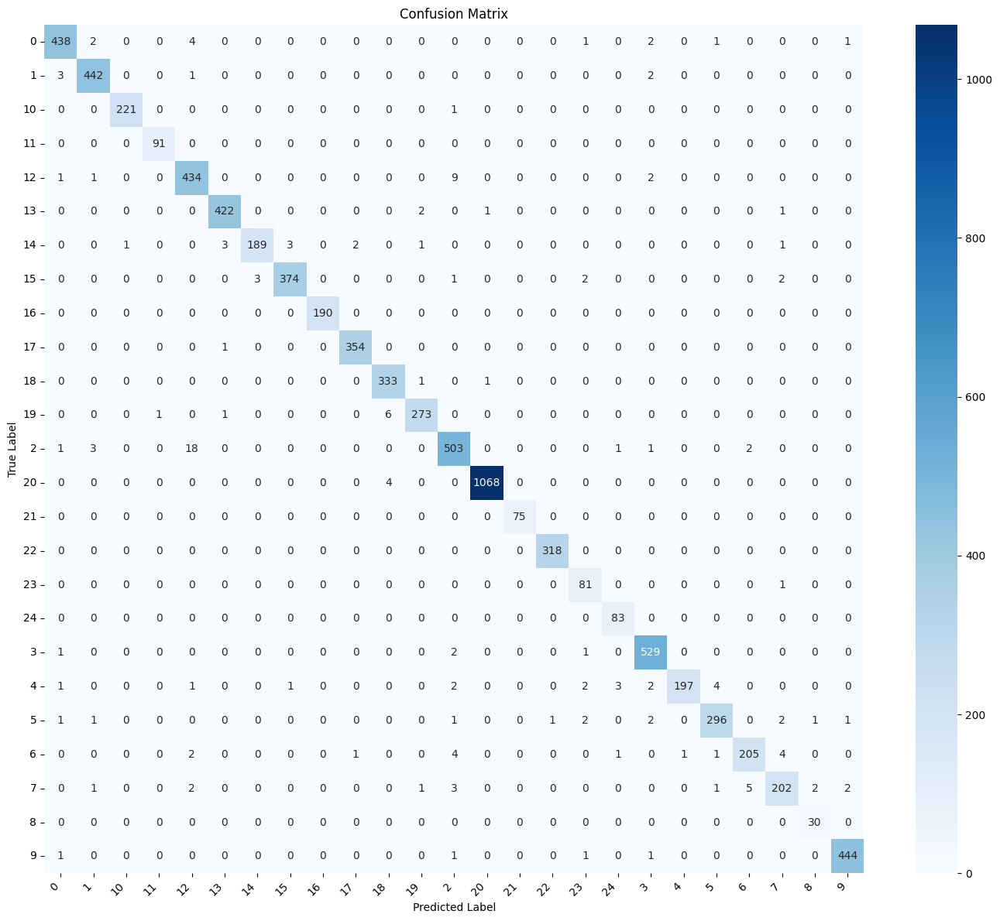

In [26]:
# confusion matrix.
conf_matrix = confusion_matrix(test_true_labels, test_predicted_labels)
plt.figure(figsize=(14, 12))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names_list, yticklabels=class_names_list)
plt.xlabel('Predicted Label'); plt.ylabel('True Label'); plt.title('Confusion Matrix')
plt.xticks(rotation=45, ha='right'); plt.yticks(rotation=0); plt.tight_layout()
plt.show()

In [27]:
# classification report (precision, recall, F1-score).
print(classification_report(test_true_labels, test_predicted_labels, target_names=class_names_list))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       449
           1       0.98      0.99      0.98       448
          10       1.00      1.00      1.00       222
          11       0.99      1.00      0.99        91
          12       0.94      0.97      0.95       447
          13       0.99      0.99      0.99       426
          14       0.98      0.94      0.96       200
          15       0.99      0.98      0.98       382
          16       1.00      1.00      1.00       190
          17       0.99      1.00      0.99       355
          18       0.97      0.99      0.98       335
          19       0.98      0.97      0.98       281
           2       0.95      0.95      0.95       529
          20       1.00      1.00      1.00      1072
          21       1.00      1.00      1.00        75
          22       1.00      1.00      1.00       318
          23       0.90      0.99      0.94        82
          24       0.94    

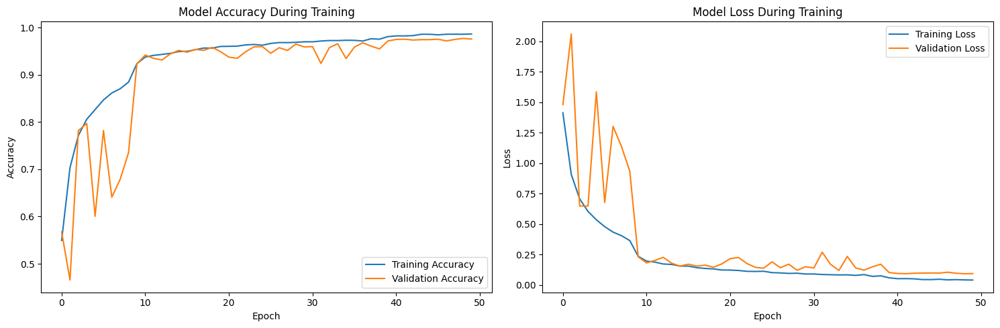

In [28]:
# Plot training history
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy During Training')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
plt.show()

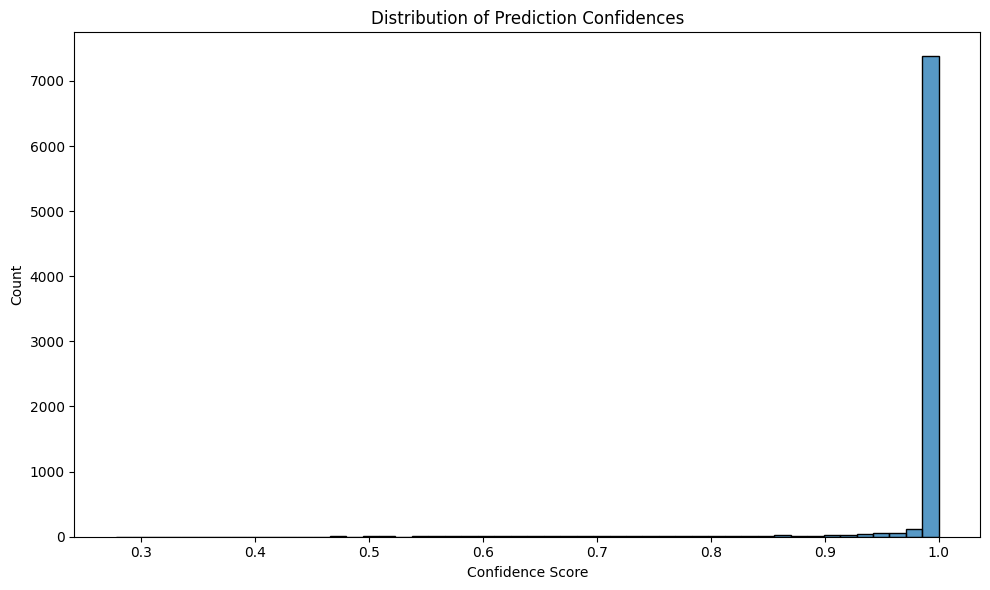

In [29]:
# Plot prediction confidence distribution
prediction_confidences = np.max(test_predictions, axis=1)
plt.figure(figsize=(10, 6))
sns.histplot(data=prediction_confidences, bins=50)
plt.title('Distribution of Prediction Confidences')
plt.xlabel('Confidence Score')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

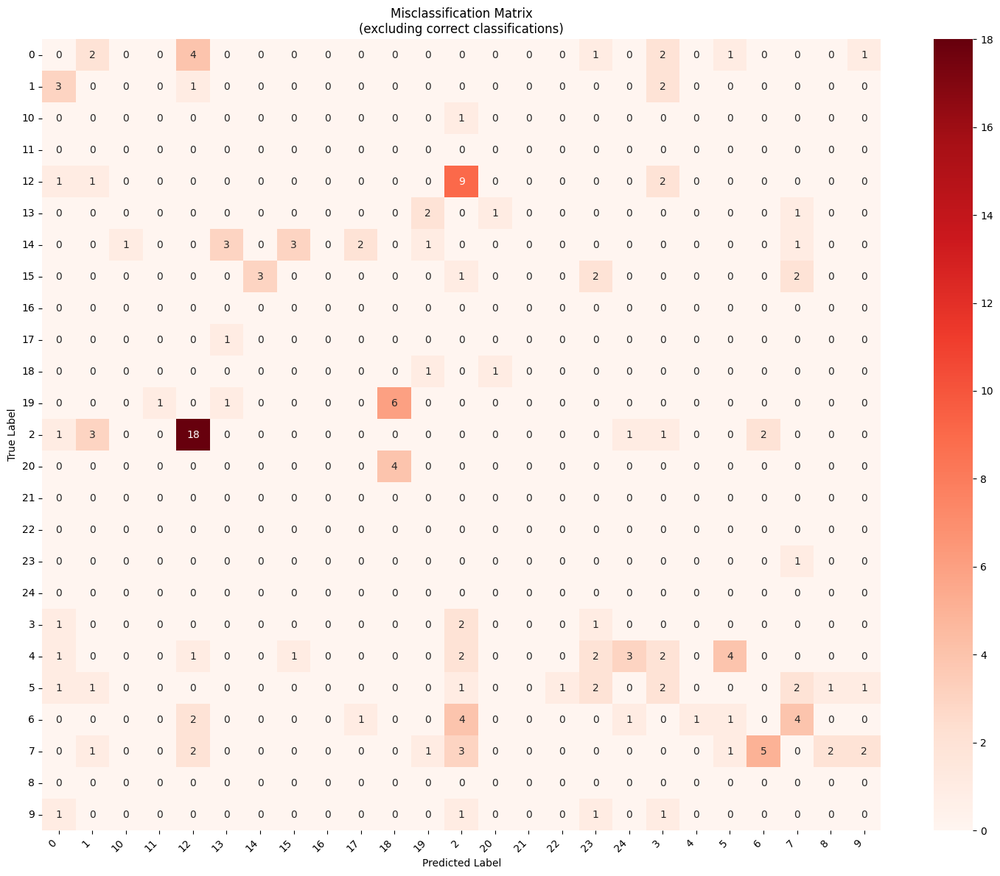

In [30]:
# Plot misclassification matrix
misclass_matrix = conf_matrix.copy()
np.fill_diagonal(misclass_matrix, 0)  # Remove correct classifications
plt.figure(figsize=(15, 12))
sns.heatmap(misclass_matrix, annot=True, fmt='d', cmap='Reds', 
            xticklabels=class_names_list, yticklabels=class_names_list)
plt.title('Misclassification Matrix\n(excluding correct classifications)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

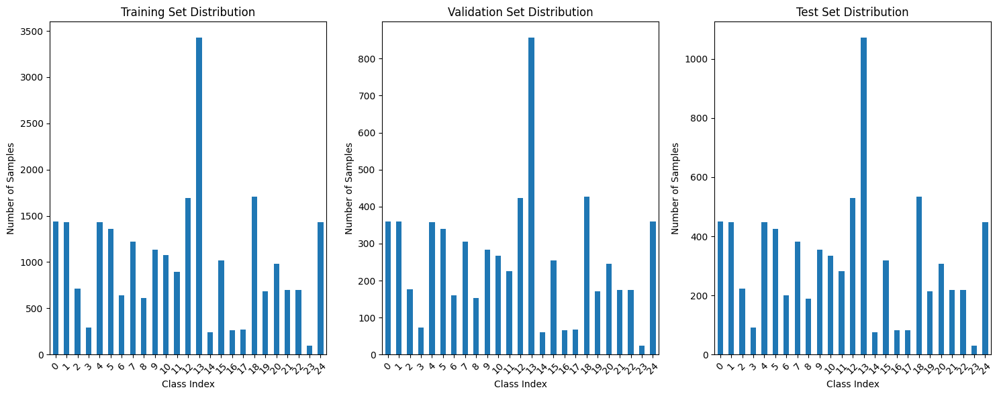

In [31]:
# Plot class distribution in training, validation and test sets
plt.figure(figsize=(15, 6))
train_dist = pd.Series(train_generator.classes).value_counts().sort_index()
val_dist = pd.Series(val_generator.classes).value_counts().sort_index()
test_dist = pd.Series(test_generator.classes).value_counts().sort_index()

plt.subplot(1, 3, 1)
train_dist.plot(kind='bar')
plt.title('Training Set Distribution')
plt.xlabel('Class Index')
plt.ylabel('Number of Samples')
plt.xticks(rotation=45)

plt.subplot(1, 3, 2)
val_dist.plot(kind='bar')
plt.title('Validation Set Distribution')
plt.xlabel('Class Index')
plt.ylabel('Number of Samples')
plt.xticks(rotation=45)

plt.subplot(1, 3, 3)
test_dist.plot(kind='bar')
plt.title('Test Set Distribution')
plt.xlabel('Class Index')
plt.ylabel('Number of Samples')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

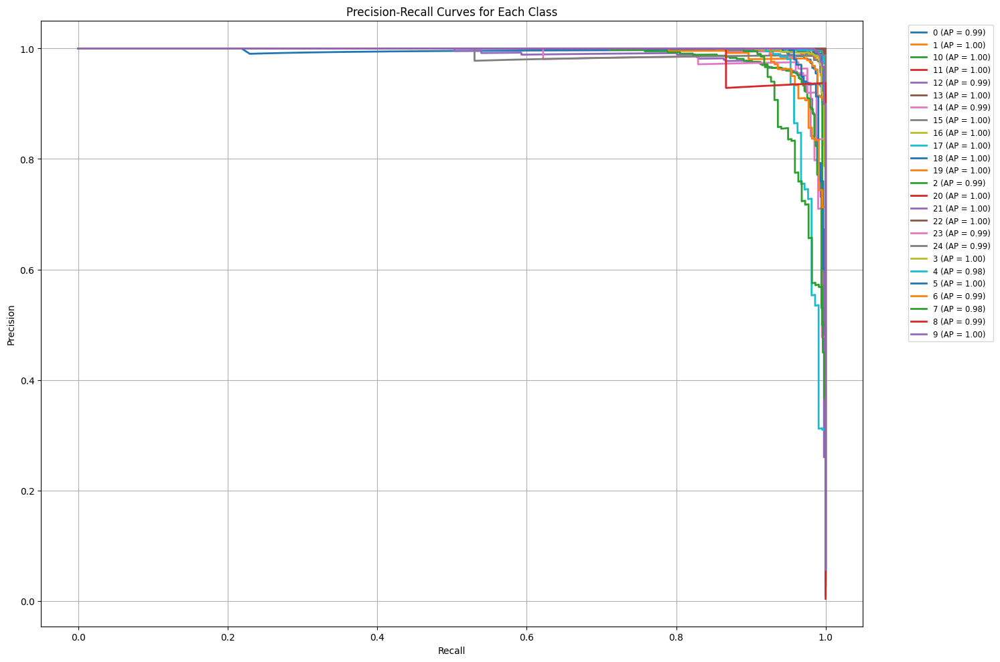

In [32]:
# Binarize the labels for multi-class precision-recall curve
y_test_bin = label_binarize(test_true_labels, classes=range(n_classes))

plt.figure(figsize=(15, 10))
for i in range(n_classes):
    precision, recall, _ = precision_recall_curve(
        y_test_bin[:, i],
        test_predictions[:, i]
    )
    avg_precision = average_precision_score(
        y_test_bin[:, i],
        test_predictions[:, i]
    )
    
    # Only plot if there are positive samples for this class
    if np.sum(y_test_bin[:, i]) > 0:
        plt.plot(recall, precision, lw=2, 
                label=f'{class_names_list[i]} (AP = {avg_precision:.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curves for Each Class')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
plt.grid(True)
plt.tight_layout()
plt.show()

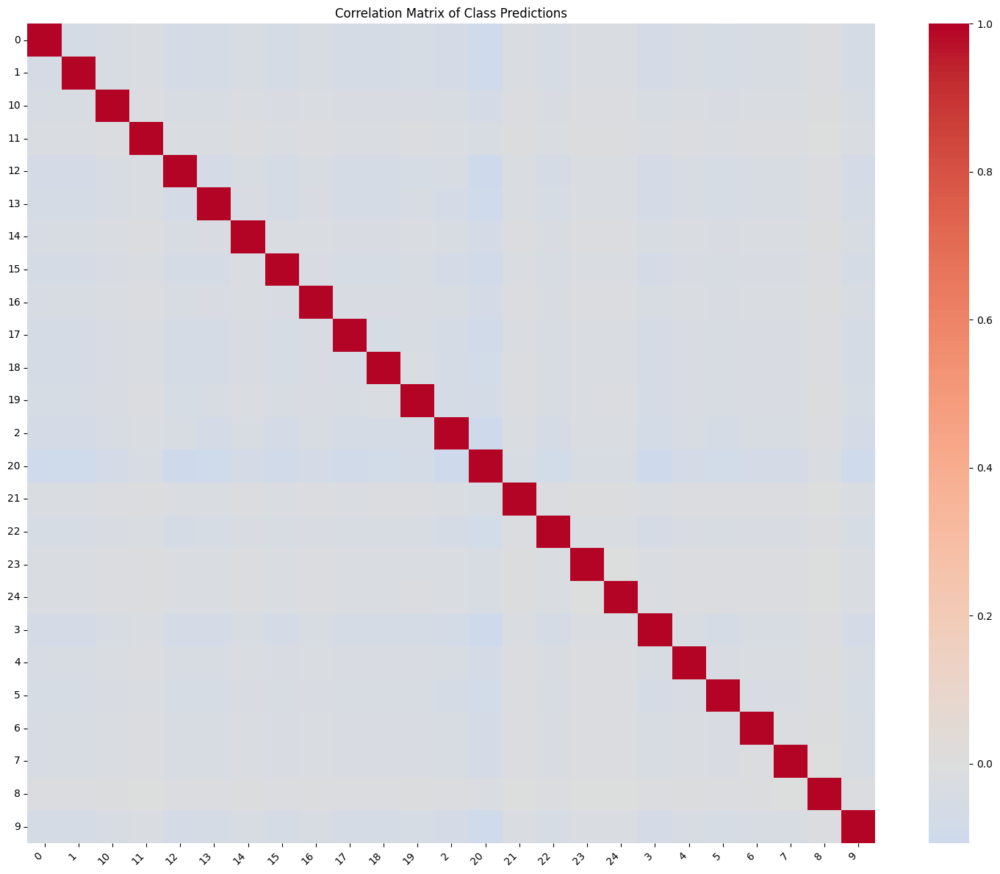

In [33]:
# Plot correlation matrix between class predictions
prediction_correlations = np.corrcoef(test_predictions.T)
plt.figure(figsize=(15, 12))
sns.heatmap(prediction_correlations, cmap='coolwarm', center=0,
            xticklabels=class_names_list, yticklabels=class_names_list)
plt.title('Correlation Matrix of Class Predictions')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

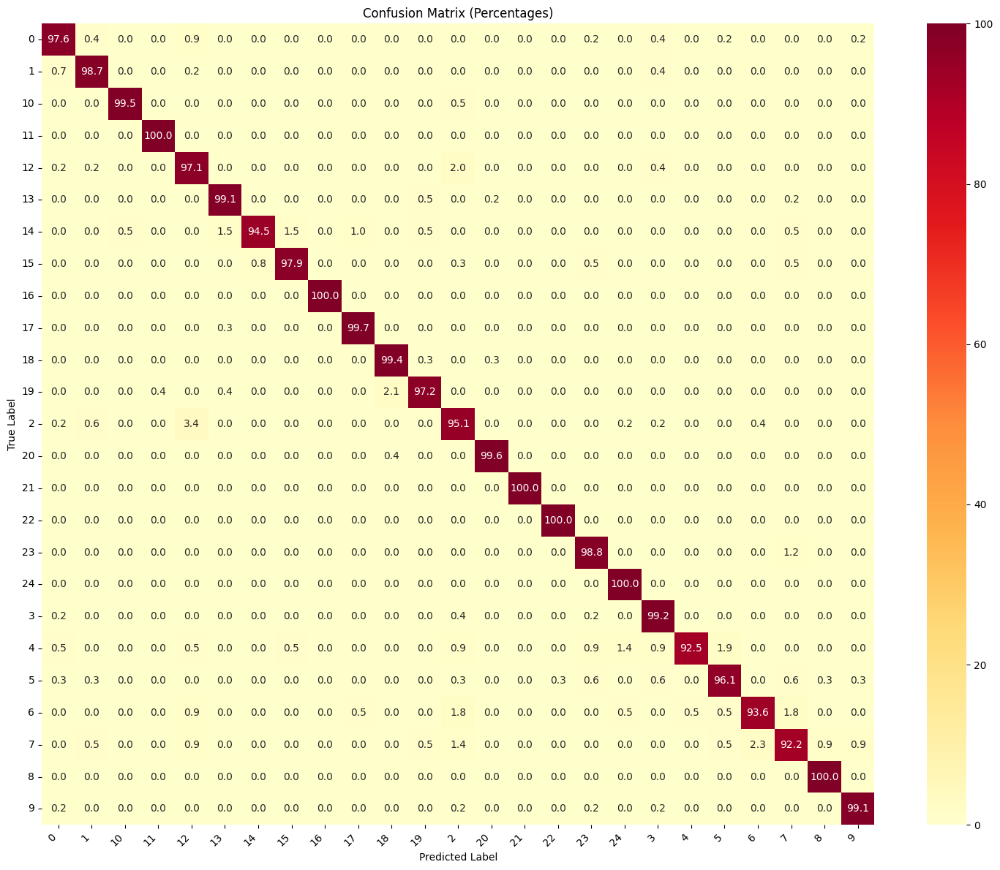

In [34]:
# Plot confusion matrix with percentages
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100
plt.figure(figsize=(15, 12))
sns.heatmap(conf_matrix_percent, annot=True, fmt='.1f', cmap='YlOrRd',
            xticklabels=class_names_list, yticklabels=class_names_list)
plt.title('Confusion Matrix (Percentages)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


In [35]:
# --- Optional Fine-Tuning Phase ---
print("\n--- Starting Fine-Tuning ---")
for layer in model.layers:
    layer.trainable = True

learning_rate_finetune = 0.00001
model.compile(optimizer=Adam(learning_rate=learning_rate_finetune),
            loss='categorical_crossentropy',
            metrics=['accuracy'])
model.summary()

epochs_finetune = 10
history_finetune = model.fit(
    train_generator,
    epochs=epochs_finetune,
    initial_epoch=history.epoch[-1],
    validation_data=val_generator,
    callbacks=[early_stopping, reduce_lr]
)
print("--- Fine-Tuning Finished ---")


--- Starting Fine-Tuning ---


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 73, 73, 64)     │         9,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 73, 73, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 73, 73, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 24, 24, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 24, 24, 128)    │        73,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 24, 24, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 24, 24, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 12, 12, 128)    │       147,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 12, 12, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 6, 6, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 6, 6, 256)      │       294,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 6, 6, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 6, 6, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 3, 3, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 3, 3, 256)      │       589,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 3, 3, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 3, 3, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 1, 1, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │        65,536 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 1,257,433 (4.80 MB)

 Trainable params: 1,255,257 (4.79 MB)

 Non-trainable params: 2,176 (8.50 KB)

--- Fine-Tuning Finished ---


In [36]:
# Evaluate the model again after fine-tuning.
test_loss_ft, test_accuracy_ft = model.evaluate(test_generator)
print(f"Fine-Tuned Test Loss: {test_loss_ft}, Fine-Tuned Test Accuracy: {test_accuracy_ft}")

249/249 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - accuracy: 0.9789 - loss: 0.0767
Fine-Tuned Test Loss: 0.07873231917619705, Fine-Tuned Test Accuracy: 0.9795097708702087


In [37]:
# Plot accuracy and loss curves for the fine-tuning phase.
plt.figure(figsize=(12, 5))

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

In [38]:
# Get the available metrics from history
available_metrics = history_finetune.history.keys()

In [39]:
# Plot training curves if metrics are available
if 'accuracy' in available_metrics or 'acc' in available_metrics:
    accuracy_key = 'accuracy' if 'accuracy' in available_metrics else 'acc'
    val_accuracy_key = 'val_' + accuracy_key

    plt.subplot(1, 2, 1)
    plt.plot(history_finetune.history[accuracy_key], label='Training Accuracy (FT)')
    if val_accuracy_key in available_metrics:
        plt.plot(history_finetune.history[val_accuracy_key], label='Validation Accuracy (FT)')
    plt.title('Fine-Tuning Accuracy')
    plt.xlabel('Epochs (FT)')
    plt.ylabel('Accuracy')
    plt.legend()

if 'loss' in available_metrics:
    plt.subplot(1, 2, 2)
    plt.plot(history_finetune.history['loss'], label='Training Loss (FT)')
    if 'val_loss' in available_metrics:
        plt.plot(history_finetune.history['val_loss'], label='Validation Loss (FT)')
    plt.title('Fine-Tuning Loss')
    plt.xlabel('Epochs (FT)')
    plt.ylabel('Loss')
    plt.legend()

plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

In [40]:
# --- Post Fine-Tuning Evaluation ---
test_predictions_ft = model.predict(test_generator)
test_predicted_labels_ft = np.argmax(test_predictions_ft, axis=1)
conf_matrix_ft = confusion_matrix(test_true_labels, test_predicted_labels_ft)

249/249 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step


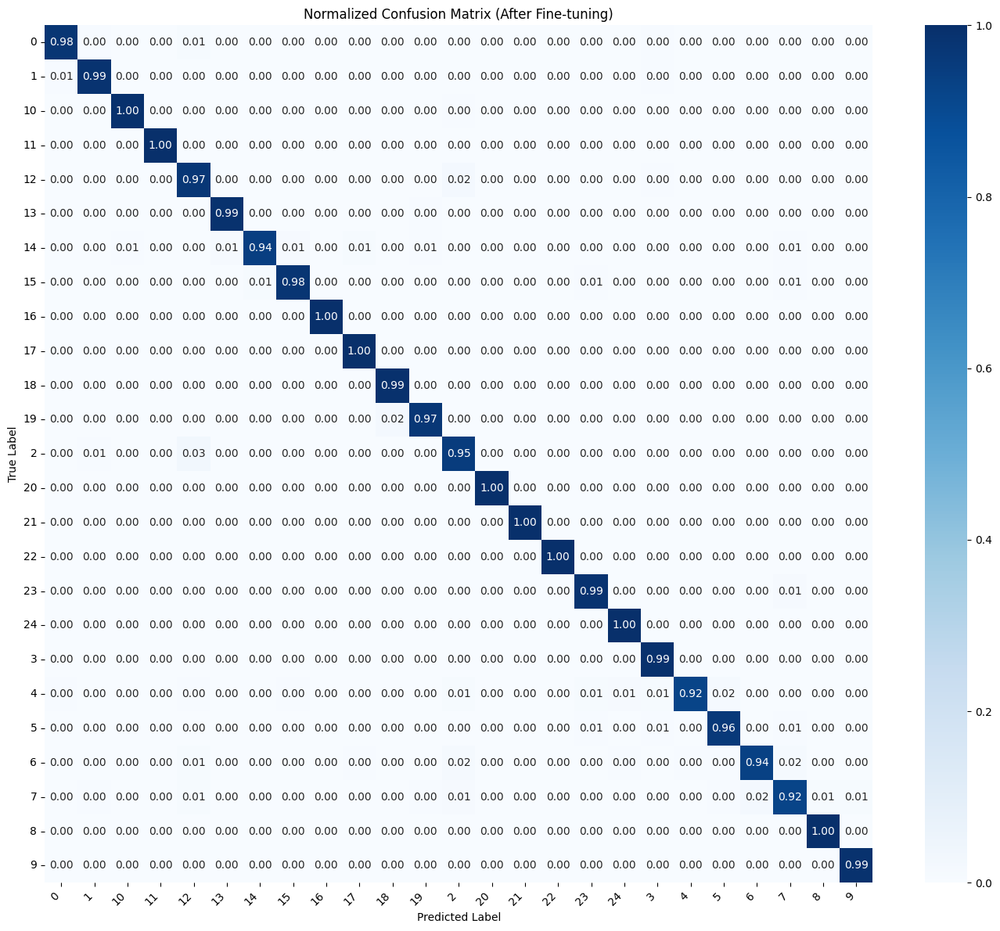

In [41]:
# Display the normalized confusion matrix.
try:
    normalized_conf_matrix = conf_matrix_ft.astype('float') / conf_matrix_ft.sum(axis=1)[:, np.newaxis]
    normalized_conf_matrix = np.nan_to_num(normalized_conf_matrix)
    plt.figure(figsize=(14, 12))
    sns.heatmap(normalized_conf_matrix, annot=True, fmt='.2f', cmap='Blues', xticklabels=class_names_list, yticklabels=class_names_list)
    plt.xlabel('Predicted Label'); plt.ylabel('True Label'); plt.title('Normalized Confusion Matrix (After Fine-tuning)')
    plt.xticks(rotation=45, ha='right'); plt.yticks(rotation=0); plt.tight_layout()
    plt.show()
except Exception as e:
    print(f"Error creating normalized confusion matrix: {str(e)}")

In [42]:
# Display ROC curve for each class
try:
    from sklearn.metrics import roc_curve, auc
    fpr, tpr, roc_auc = dict(), dict(), dict()
    plt.figure(figsize=(12, 10))
    for i in range(n_classes):
        binary_true = (test_true_labels == i).astype(int)
        binary_pred_probs = test_predictions_ft[:, i]
        fpr[i], tpr[i], _ = roc_curve(binary_true, binary_pred_probs)
        roc_auc[i] = auc(fpr[i], tpr[i])
        plt.plot(fpr[i], tpr[i], lw=2, label=f'{class_names_list[i]} (AUC = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate')
    plt.title('ROC Curve per Class (After Fine-tuning)'); plt.legend(loc="lower right")
    plt.tight_layout(); plt.show()
except Exception as e:
    print(f"Error creating ROC curves: {str(e)}")

Error creating ROC curves: 'bool' object has no attribute 'astype'


<Figure size 1200x1000 with 0 Axes>

In [43]:
# --- Prediction Function and Example ---
def predict(model, img_array, class_names_list):
    img_batch = tf.expand_dims(img_array, 0) # Create batch
    predictions = model.predict(img_batch)
    predicted_index = np.argmax(predictions[0])
    predicted_class = class_names_list[predicted_index]
    confidence = round(100 * np.max(predictions[0]), 2)
    return predicted_class, confidence

In [44]:
# Example: Predict labels for a few images from the test batch.
images_batch, labels_batch = next(test_generator)
for i in range(min(len(images_batch), 5)):
    predicted_class, confidence = predict(model, images_batch[i], class_names_list)
    actual_class = class_names_list[np.argmax(labels_batch[i])]
    print(f"Img {i+1} - Actual: {actual_class}, Predicted: {predicted_class}, Confidence: {confidence}%")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step
Img 1 - Actual: 22, Predicted: 22, Confidence: 100.0%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
Img 2 - Actual: 10, Predicted: 10, Confidence: 100.0%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Img 3 - Actual: 22, Predicted: 22, Confidence: 100.0%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Img 4 - Actual: 12, Predicted: 12, Confidence: 100.0%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Img 5 - Actual: 2, Predicted: 2, Confidence: 99.05%


In [45]:
# --- Save and Load Model ---
# Save the final trained model.
model_save_path = 'plant_disease_model_final.h5'
model.save(model_save_path)
print(f"Model saved to {model_save_path}")

Model saved to plant_disease_model_final.h5


In [46]:
# Load the saved model (for later use or deployment).
loaded_model = load_model(model_save_path)
print(f"Model loaded from {model_save_path}")

Model loaded from plant_disease_model_final.h5


In [47]:
# Define the class_labels_dict with class labels and corresponding indices
class_labels_dict_manual = {
    0: "Aphids_cotton", 1: "Army worm_cotton", 2: "Bacterial blight_cotton", 3: "Healthy_cotton",
    4: "Pepper_bell__bacterial_spot", 5: "Pepper_bell__healthy", 6: "Potato___Early_blight",
    7: "Potato___Late_blight", 8: "Potato___healthy", 9: "Powdery mildew_cotton",
    10: "Strawberry___Leaf_scorch", 11: "Strawberry___healthy",
    12: "Target spot_cotton", 13: "Tomato___Bacterial_spot",
    14: "Tomato___Early_blight", 15: "Tomato___Late_blight", 16: "Tomato___Leaf_Mold",
    17: "Tomato___Septoria_leaf_spot", 18: "Tomato___Spider_mites Two-spotted_spider_mite", 19: "Tomato___Target_Spot",
    20: "Tomato___Tomato_Yellow_Leaf_Curl_Virus", 21: "Tomato___Tomato_mosaic_virus",
    22: "Tomato___healthy", 23: "cotton_curl_virus", 24: "cotton_fussarium_wilt"
}

In [48]:
# --- Prediction on a New Image and Treatment Lookup ---
# Define path to a new image for prediction.
new_image_path = "G:/ksiu/Level 4/Graduation Project (AIE493) Dr. Saeed/graduation project/code ai & Data/plantvillage dataset/color/Healthy_cotton/16.jpg"

In [49]:
# Load and preprocess the new image.
new_image = keras_image.load_img(new_image_path, target_size=(224, 224))
new_image_array = keras_image.img_to_array(new_image)
new_image_array = np.expand_dims(new_image_array, axis=0)
new_image_array = new_image_array / 255.0

In [50]:
# Predict the class for the new image using the loaded model.
predicted_probabilities = loaded_model.predict(new_image_array)[0]
predicted_index = np.argmax(predicted_probabilities)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


In [51]:
# Map the predicted index back to the class name.
# Use the generator's mapping if available, otherwise use a manual mapping.
if 'test_generator' in locals():
    index_to_class = {v: k for k, v in test_generator.class_indices.items()}
    predicted_class_label = index_to_class.get(predicted_class_index, 'Unknown Class')
else:
    class_labels_dict_manual = {idx: name for idx, name in enumerate(class_names_list)}
    predicted_class_label = class_labels_dict_manual.get(predicted_class_index, 'Unknown Class')

confidence_score = round(np.max(predicted_probabilities) * 100, 2)

NameError: name 'predicted_class_index' is not defined

In [ ]:
# Display the new image and its prediction.
plt.imshow(new_image)
plt.title(f"Predicted: {class_labels[predicted_class_label]}\nConfidence: {confidence_score}%")
plt.axis('off'); plt.show()

In [ ]:
# --- Look up Treatment Information ---
# Read treatment data from an Excel file.
treatment_file_path = "G:/ksiu/Level 4/Graduation Project (AIE493) Dr. Saeed/graduation project/code ai & Data/plant disease.xlsx"
try:
    treatment_df = pd.read_excel(treatment_file_path)
    disease_column_name = treatment_df.columns[0]
    treatment_info = treatment_df[treatment_df[disease_column_name].str.strip().str.lower() == class_labels[predicted_class_label].strip().lower()]

    if not treatment_info.empty:
        print("\n--- Treatment Information ---")
        print(f"Disease/Condition: {class_labels[predicted_class_label]}")
        print(f"\nTreatment (English):\n{treatment_info.iloc[0, 1]}")
        print(f"\nTreatment (Arabic):\n{treatment_info.iloc[0, 2]}")
        print(f"\nResources:\n{treatment_info.iloc[0, 3]}")
        print("-" * 30)
    else:
        print(f"\nNo treatment information found for '{class_labels[predicted_class_label]}'.")
except FileNotFoundError:
    print(f"Error: Treatment file not found at '{treatment_file_path}'")
except Exception as e:
    print(f"Error reading or processing treatment file: {str(e)}")